In [1]:
#Packages to help with analysis
import matplotlib.pyplot as plt
import nltk, re, tweepy 
import numpy as np
import pandas as pd
import pyreadstat
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.stem import WordNetLemmatizer
import gensim
from collections import Counter
import sklearn
from textblob import TextBlob
from sklearn.manifold import TSNE
from textblob import Word
from spellchecker import SpellChecker
%matplotlib inline

import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from pytorch_pretrained_bert import BertTokenizer, BertConfig
from pytorch_pretrained_bert import BertAdam, BertForSequenceClassification
from tqdm import tqdm, trange
import pandas as pd
import io
import numpy as np
import matplotlib.pyplot as plt


from transformers import * 

Using TensorFlow backend.
/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:529: FutureWarn

# Let's Take a Look at the Data

In [2]:
pd.set_option('display.max_columns', None)
df, meta = pyreadstat.read_sav('Emotional Well-Being - CASEL COVID-19 Webinar_Anon.sav')
df.head()

,StartDate,EndDate,Progress,Duration__in_seconds_,Finished,RecordedDate,ResponseId,OpenEmotions_1,OpenEmotions_3,OpenEmotions_4,ClosedEmotions_1,ClosedEmotions_2,ClosedEmotions_3,ClosedEmotions_4,ClosedEmotions_5,ClosedEmotions_6,StressCauses_1,StressCauses_12,StressCauses_13,JoyCauses_1,JoyCauses_12,JoyCauses_13,Strats_EffectiveSelf_1,Strats_EffectiveSelf_2,Strats_EffectiveSelf_3,Strats_EffectiveOthe_1,Strats_EffectiveOthe_2,Strats_EffectiveOthe_3,ER_1,ER_2,WellBeingSupport_16,WellBeingSupport_17,WellBeingSupport_18,CASELWebinars_16,CASELWebinars_17,CASELWebinars_18,Age,Race_1,Race_2,Race_3,Race_4,Race_5,Race_6,Race_7,Race_8,Race_8_TEXT,Gender,Gender_3_TEXT,Educator,Role_11,Role_12,Role_1,Role_2,Role_3,Role_4,Role_5,Role_6,Role_7,Role_8,Role_10,Role_10_TEXT,Grade_1,Grade_2,Grade_3,Grade_4,StudentSES_1
0,2020-03-24 16:47:03,2020-03-24 16:52:06,100.0,302.0,1.0,2020-03-24 16:52:06,R_Q64hfjjdCiGnM09,Anxious,Sad,Fearful,6.0,6.0,3.0,5.0,5.0,3.0,uncertainty,News,updates,kids,work,family,stop soical media,running,journaling,,,,NaN,NaN,,,,,,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
1,2020-03-24 16:48:25,2020-03-24 16:52:45,100.0,259.0,1.0,2020-03-24 16:52:45,R_Anw03Hj4s7jxnfH,anxiety,fear,hope,5.0,6.0,3.0,4.0,3.0,4.0,worry about others,worry about self,loss of normal routine,connecting with others,,,yoga,connecting with others,,listen to them,provide facts,provide resources,3.0,4.0,Less cognitive demands,Show grace and understanding,Listen to what people need,,,,39,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,,2.0,,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
2,2020-03-24 16:51:16,2020-03-24 16:52:49,100.0,92.0,1.0,2020-03-24 16:52:49,R_32UYohfSNVrkECi,,,,NaN,NaN,NaN,NaN,NaN,NaN,,,,,,,,,,,,,NaN,NaN,,,,,,,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,NaN,NaN
3,2020-03-24 16:47:38,2020-03-24 16:53:13,100.0,334.0,1.0,2020-03-24 16:53:13,R_24PeWDZ57ldPxMy,Fear,Sadness,Anger,5.0,5.0,4.0,5.0,4.0,3.0,Uncertainty,Change,Finances,Family,Connectedness,Quiet,Breathing,Meditation,Exercise,Calm leadership,Meditation,Optimism,5.0,6.0,Reassurance,Non-education related activities that increase...,"Ways of increasing normalcy, routine, and conn...",,,,36,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,,2.0,,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,NaN,NaN,1.0,5.0
4,2020-03-24 16:46:45,2020-03-24 16:53:26,100.0,400.0,1.0,2020-03-24 16:53:26,R_wMCGldjiVHje0o1,Panic,Terror,Depression,3.0,5.0,4.0,4.0,4.0,5.0,Fear for my health,Fear for my family’s health,Social isolation,My son’s smile,My son’s laughter,Old VMs from a friend,Yoga,EFT,Nature,Outside time,Validating feelings,Hugging,5.0,5.0,Acceptance of all feelings,Tools to use in the moment,Space,Access to physical touch,Self reg strategies,EFT,,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,,2.0,,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,Private SLP,1.0,1.0,NaN,1.0,8.0


# Combine all stress repsonse in one Series all_strats

In [3]:
most_feelings_current_climate = []
##
##Append variables
aux = np.append(most_feelings_current_climate, df['StressCauses_1'])
aux1 = np.append(aux, df['StressCauses_12'])
aux2strat = np.append(aux1, df['StressCauses_13'])

##Create series and lovercase all characters
##/
all_strats = pd.Series(pd.Series([x.lower() for x in aux2strat]))
all_strategies  = pd.Series([i for i in all_strats if i])


In [4]:
import numpy as np
import math
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
import torch
import transformers as ppb
import warnings
warnings.filterwarnings('ignore')

##### First batch of starategies in text form

In [5]:
# def bachs(strategies):    

bach_1 = all_strategies
# baches = math.ceil(len(all_strategies)/1000)
# bach = []
# for i in np.arange(baches):
#     bach.append(all_strategies[(i*1000):((i+1)*1000)])

    


*input:
bach_1*

*output:
0             uncertainty
1      worry about others
2             uncertainty
3      fear for my health
4                  health
              ...        
995             uncertain
996      business closing
997           the unknown
998          staying home
999           uncertainty*

###### Model set up

In [6]:
# For DistilBERT:
model_class, tokenizer_class, pretrained_weights = (ppb.DistilBertModel, ppb.DistilBertTokenizer, 'distilbert-base-uncased')

## Want BERT instead of distilBERT? Uncomment the following line:
#model_class, tokenizer_class, pretrained_weights = (ppb.BertModel, ppb.BertTokenizer, 'bert-base-uncased')

# Load pretrained model/tokenizer
tokenizer = tokenizer_class.from_pretrained(pretrained_weights)
model = model_class.from_pretrained(pretrained_weights)

#### Encoded values

In [7]:
tokenized = bach_1.apply((lambda x: tokenizer.encode(x, add_special_tokens=True)))

*input: tokenized*


*output:*
*0                       [101, 12503, 102]
1            [101, 4737, 2055, 2500, 102]
2                       [101, 12503, 102]
3      [101, 3571, 2005, 2026, 2740, 102]
4                        [101, 2740, 102]
                      ...                
995                      [101, 9662, 102]
996                [101, 2449, 5494, 102]
997                [101, 1996, 4242, 102]
998                [101, 6595, 2188, 102]
999                     [101, 12503, 102]*

#### Padded encoded values

In [8]:
max_len = 0
for i in tokenized.values:
    if len(i) > max_len:
        max_len = len(i)

padded = np.array([i + [0]*(max_len-len(i)) for i in tokenized.values])


*input: padded*
    
*output: array([[  101, 12503,   102, ...,     0,     0,     0],
       [  101,  4737,  2055, ...,     0,     0,     0],
       [  101, 12503,   102, ...,     0,     0,     0],
       ...,
       [  101,  1996,  4242, ...,     0,     0,     0],
       [  101,  6595,  2188, ...,     0,     0,     0],
       [  101, 12503,   102, ...,     0,     0,     0]])*


#### A dictionary attaching the encoded variables to their word meanings

In [10]:
padded_list =  list(padded)
bach_1_list = list(bach_1)

embedding_dict = {bach_1_list[i] : padded_list[i] for i in range(len(bach_1_list))} 


*input: embedding_dict*

*output: {'uncertainty': array([  101, 12503,   102,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0]),
 
 
 'worry about others': array([ 101, 4737, 2055, 2500,  102,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0])*

### Shows which units are actually used in the encoding

In [11]:
attention_mask = np.where(padded != 0, 1, 0)
attention_mask.shape
len(attention_mask)


data = pd.DataFrame(list(zip(bach_1_list, padded_list, attention_mask)), columns= ("word", 'padded', 'mask'))
data
# test = padded[(1*1000):((2)*1000)]
# len(test)
# print([torch.tensor(padded[(0*1000):((1)*1000)])])
# #list(torch.tensor(padded[(i*1000):((i+1)*1000)]))

,word,padded,mask
0,uncertainty,"[101, 12503, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,worry about others,"[101, 4737, 2055, 2500, 102, 0, 0, 0, 0, 0, 0,...","[1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,uncertainty,"[101, 12503, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,fear for my health,"[101, 3571, 2005, 2026, 2740, 102, 0, 0, 0, 0,...","[1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,health,"[101, 2740, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
...,...,...,...
14939,unprecedented,"[101, 15741, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
14940,panic,"[101, 6634, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
14941,how will this affect my job long term,"[101, 2129, 2097, 2023, 7461, 2026, 3105, 2146...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, ..."
14942,false starts,"[101, 6270, 4627, 102, 0, 0, 0, 0, 0, 0, 0, 0,...","[1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [12]:
baches = math.ceil(len(all_strategies)/1000)
small_bach = 1
hidden_states = [] 
for i in np.arange(small_bach):
    sub_data = (data[(i*1000):((i+1)*1000)])
    #input_id = np.row_stack(input_id, pad)
    #input_id = np.concatenate((input_id, id_aux))
    
    attention_masks = torch.tensor(list(sub_data['mask']))
    input_id = torch.tensor(list(sub_data['padded']))
    with torch.no_grad():
        last_hidden_states = model(input_id, attention_mask=attention_masks)
    print("working")
    hidden_states.append(list([last_hidden_states]))

    



working


In [13]:
test = hidden_states[0]
test
hidden_states[0][0][0][:,0,:]

tensor([[-0.1958, -0.0047, -0.1302,  ..., -0.1872,  0.0775,  0.4040],
        [-0.0706, -0.0244, -0.2148,  ..., -0.0798,  0.1180,  0.2029],
        [-0.1958, -0.0047, -0.1302,  ..., -0.1872,  0.0775,  0.4040],
        ...,
        [-0.2479, -0.0934, -0.0103,  ..., -0.1205,  0.2210,  0.3135],
        [-0.1541, -0.0684,  0.0186,  ..., -0.1780,  0.0468,  0.1950],
        [-0.1958, -0.0047, -0.1302,  ..., -0.1872,  0.0775,  0.4040]])

#### Where the magic happens! Turns the unique values that were created above into embedding that pull on word and sentence meaning using the BERT model

In [14]:

from sentence_transformers import SentenceTransformer
# for i in 

# with torch.no_grad():
#     last_hidden_states = model(input_ids, attention_mask=attention_mask)

ModuleNotFoundError: No module named 'sentence_transformers'

#### The output of this is complex.  

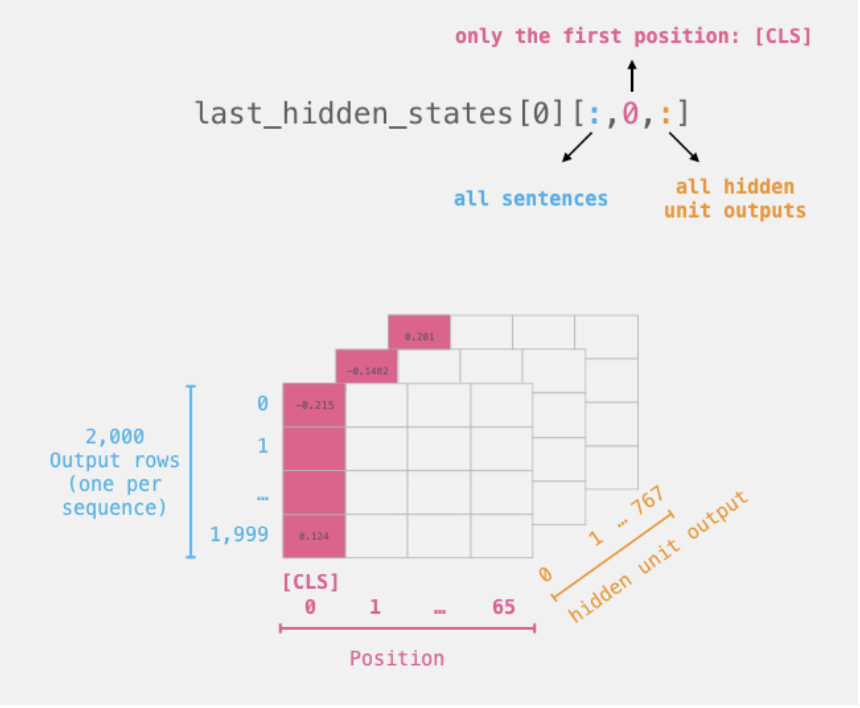


We only want the first column, which is the class [CLS] token


### Features = the embedding variables we are looking to classify

In [370]:
#features = last_hidden_states[0][:,0,:].numpy()
features = []
for i in np.arange(len(hidden_states)):
    features.extend(hidden_states[i][0][0][:,0,:].numpy())
    
features

[array([-1.95769116e-01, -4.70168050e-03, -1.30158767e-01, -4.24198508e-02,
        -5.27594015e-02, -1.90804936e-02, -2.53071077e-02,  5.85884079e-02,
        -1.65152684e-01, -3.31445664e-01, -7.08028376e-02,  4.97281626e-02,
        -1.74294695e-01,  2.55957007e-01,  4.26823944e-02,  1.10415630e-01,
        -1.20556340e-01,  9.09199044e-02,  2.25868881e-01, -2.06931472e-01,
        -7.93372095e-02, -1.11395665e-01, -2.10133433e-01, -1.52428910e-01,
        -1.05193123e-01, -7.07575381e-02, -1.31615009e-02, -6.72747344e-02,
         4.84353229e-02,  1.08569749e-01, -4.87191044e-02,  1.93584606e-01,
        -2.17441514e-01,  9.11203697e-02,  4.12578844e-02,  7.41127282e-02,
         1.87153891e-01, -3.65491211e-02, -3.70982513e-02, -1.31293759e-03,
         2.07103230e-02, -2.87159011e-02,  1.87666208e-01,  3.17874774e-02,
        -1.92375630e-01, -6.50768876e-02, -1.93686771e+00, -1.79410666e-01,
        -1.34378091e-01, -2.71136373e-01, -8.71346965e-02,  9.48927179e-02,
         2.0

# We will try K-Means cluster analysis to figure out what words are similar. 
This essentially takes the embeddings (in the form [1, 8, -2, 4, ...]) and clusters the multidimensional arrays based on which ones are closest to eachother. We can choose the number of categories we want.

In [417]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
kmeans = KMeans()
type(features)

list

Text(0.5, 1.0, 'Elbow curve')

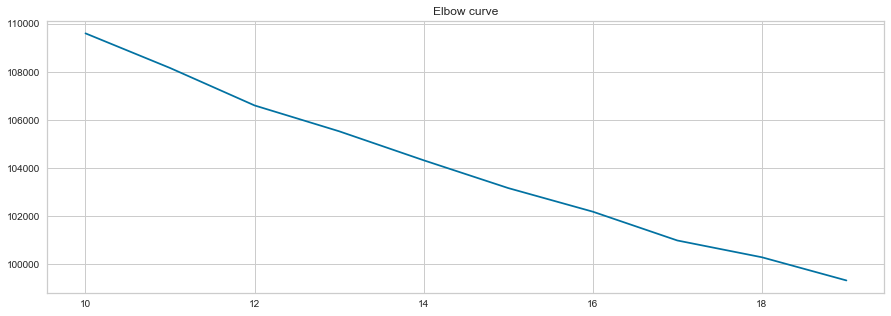

In [430]:
# visualizer = KElbowVisualizer(kmeans, k=(4,25))
# visualizer.fit(features)
# visualizer.show()  


X = features
distorsions = []
for k in range(10, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    distorsions.append(kmeans.inertia_)

fig = plt.figure(figsize=(15, 5))
plt.plot(range(10, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [431]:
def kmeans_data(n_clusters):
    ##Takes in a number
    kmeans = KMeans(n_clusters=n_clusters)
    y_kmeans = kmeans.fit_predict(features)
    df = pd.DataFrame(list(zip(bach_1_list, y_kmeans)), columns =['response', 'category']) 
    categorized = df.groupby('category')['response'].apply(list)
    categorized_data = pd.DataFrame(categorized)
    return categorized_data


new_data = kmeans_data(17)



In [432]:
writer = pd.ExcelWriter('seventeen categories.xlsx', engine='xlsxwriter')
# Write each dataframe to a different worksheet.
new_data.to_excel(writer, sheet_name='categories')

# Close the Pandas Excel writer and output the Excel file.
writer.save()

In [413]:
for r in new_data.T:
    print(r)
    print(new_data.T[r].tolist())

0
[['worry about others', 'working at home', 'reading the news', 'getting sick', 'fear of disease', 'constantly changing situations', 'schooling for son', 'not knowing what to expect', 'helplessness', 'worry over students', 'working from home', 'not knowing what to do with work', 'not working', 'husband unemployed', 'concern for family', 'worry about elderly loved ones', 'managing everything', 'working from home', 'working from home', 'people being idiots', 'loneliness - separated from loved ones', "worry about loved ones' health", 'worried about parents', 'sense of helplessness', 'family getting sick', 'juggling multiple roles', 'selfishness of others', 'getting sick', 'not knowing what to expect', 'not seeing family', 'work to accomplish', 'missing people as discussed am extrovert!', 'too many changes occurring simultaneously', 'concern for students', 'worry for ones we care for', 'work from home', 'people not taking this seriously', 'uncertainty for safety of loved ones', 'worry abo

In [412]:
see["response"]

KeyError: 0

In [377]:
categorized = df.groupby('category')['response'].apply(list)
categorized
categorized_data = pd.DataFrame(categorized)
categorized_data

,response
category,
0,"[worry about others, working at home, reading ..."
1,"[unknown, unknown future, unknown, unknown, un..."
2,[worried about students getting what they need...
3,"[concern about the health of my husband, a phy..."
4,"[health, health, employment status, health, jo..."
5,"[uncertainty, uncertainty, uncertainty, uncert..."
6,"[future, work, money, work, corona news, work,..."
7,"[virus, covid 19 outbreak, virus, exposure/inf..."
8,"[diagnosed with cancer, lack of contact with o..."


In [378]:
for r in categorized_data.T:
    print(r)
    print(categorized_data.T[r].tolist())

0
[['worry about others', 'working at home', 'reading the news', 'getting sick', 'schooling for son', 'not knowing what to expect', 'worry over students', 'working from home', 'not knowing what to do with work', 'not working', 'husband unemployed', 'worry about elderly loved ones', 'managing everything', 'working from home', 'trying to work from home with 2 kids under 2', 'working from home', 'people being idiots', 'loneliness - separated from loved ones', "worry about loved ones' health", 'worried about parents', 'family getting sick', 'kids at home', 'getting sick', 'not knowing what to expect', 'not seeing family', 'missing people as discussed am extrovert!', 'too many changes occurring simultaneously', 'work from home', 'people not taking this seriously', 'worry about elderly parents', 'unsure of what to expect', 'school from home', 'worrying about loved ones', 'getting sick', 'when school will resume', 'family getting sick', 'changing wedding plans', 'people dying', 'living in a n

In [285]:
zero =[]
a = list([np.arange(20)])
b = list([np.arange(19)])

zero.append(a)
zero.append(b)
len(zero)


2

In [275]:
a1 = [1, 'x', 'y']
a2 = [1, 'x', 'y']
a3 = [1, 'x', 'y']

b = [2, 3]

a1.append(b)
a2.insert(3, b)
a3.extend(b)

print(a1)
print(a2)
print(a3)

[1, 'x', 'y', [2, 3]]
[1, 'x', 'y', [2, 3]]
[1, 'x', 'y', 2, 3]


In [379]:
from sklearn.cluster import AgglomerativeClustering

In [384]:
# X = np.array([[1, 2], [1, 4], [1, 0],
# ...               [4, 2], [4, 4], [4, 0]])
clustering = AgglomerativeClustering(n_clusters = 12).fit(features)



In [385]:
#hire_df = pd.DataFrame(list(zip(bach_1_list, clustering)), columns =['response', 'category']) 

clustering.labels_



array([6, 3, 6, ..., 3, 8, 2])

In [387]:
hire_df = pd.DataFrame(list(zip(bach_1_list, clustering.labels_)), columns =['response', 'category']) 

In [391]:
categorized = hire_df.groupby('category')['response'].apply(list)
categorized

category
0     [health, finances, health, employment status, ...
1     [uncertainty about where the world is headed, ...
2     [overload of information/ media intake, exposu...
3     [worry about others, fear for my health, worry...
4     [family health and being seperated, the change...
5     [money, my family’s health, money, worry, fami...
6     [uncertainty, uncertainty, uncertainty, uncert...
7     [unknown, future, unknown future, unknown, unk...
8     [diagnosed with cancer, corona news, school, s...
9     [work viability, working at home, getting sick...
10    [work, work, work, work, work, work, work, wor...
11    [concern about the health of my husband, a phy...
Name: response, dtype: object